In [1]:
import seml
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

/nfs/homedirs/ayle/miniconda3/envs/gr/lib/python3.8/site-packages/seml/database.py:5: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [2]:
results = seml.get_results('resnet', to_data_frame=True)

  0%|          | 0/134 [00:00<?, ?it/s]

  0%|          | 0/134 [00:00<?, ?it/s]

/nfs/homedirs/ayle/miniconda3/envs/gr/lib/python3.8/site-packages/seml/evaluation.py:80: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  parsed = pd.io.json.json_normalize(parsed, sep='.')


In [3]:
result_cols = [col for col in results.columns if col.startswith("result")]

In [4]:
results = results.groupby(['config.arguments.train_scheme', 'config.arguments.prune_criterion', 'config.arguments.pruning_limit', 'config.arguments.seed'])[
    result_cols
].agg('mean')

In [5]:
results

result.train_acc  \
config.arguments.train_scheme config.arguments.prune_criterion config.arguments.pruning_limit config.arguments.seed                     
DefaultTrainer                EarlyJohn                        0.70                           1234                           0.953125   
                                                                                              2345                           0.984375   
                                                                                              3456                           0.906250   
                                                                                              4567                           0.953125   
                                                                                              5678                           0.921875   
                                                               0.80                           1234                           0.953125   
                                                                                              2345                           0.968750   
                                                                                              3456                           0.984375   
                                                                                              4567                           0.921875   
                                                                                              5678                           0.968750   
                                                               0.90                           1234                           0.968750   
                                                                                              2345                           0.968750   
                                                                                              3456                           0.984375   
                                                                                              4567                           0.953125   
                                                                                              5678                           0.968750   
                                                               0.98                           1234                           0.890625   
                                                                                              2345                           0.937500   
                                                                                              3456                           0.968750   
                                                                                              4567                           0.921875   
                                                                                              5678                           0.984375   
                              EmptyCrit                        0.00                           1234                           1.000000   
                                                                                              2345                           0.968750   
                                                                                              3456                           0.968750   
                                                                                              4567                           0.953125   
                                                                                              5678                           0.984375   
                              GRASP                            0.70                           1234                           0.953125   
                                                                                              2345                           0.984375   
                                                                                              3456                           0.921875   
       

In [7]:
results = results.reset_index()

In [8]:
criterions = np.delete(np.unique(results["config.arguments.prune_criterion"]), np.where(np.unique(results["config.arguments.prune_criterion"]) == "EmptyCrit"))

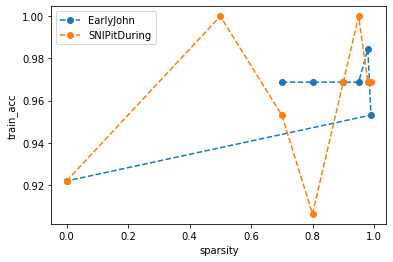

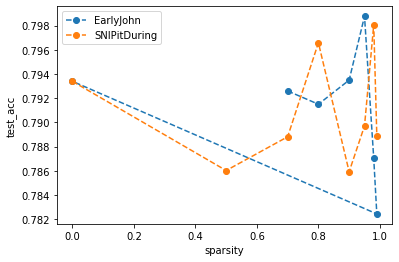

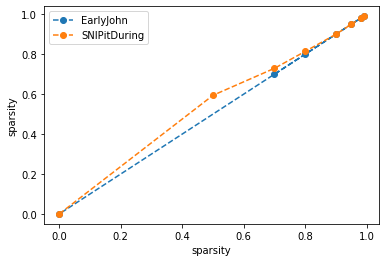

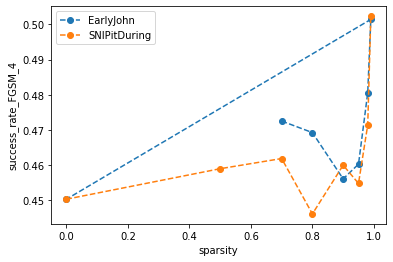

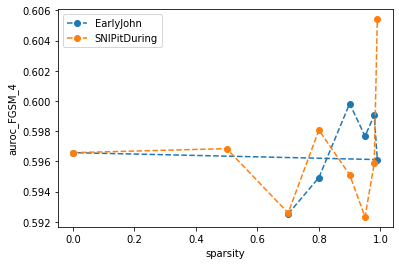

...

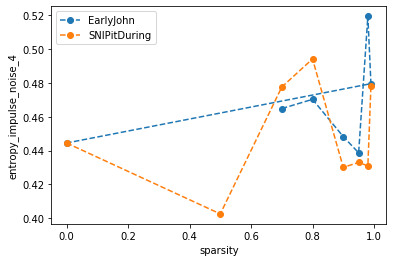

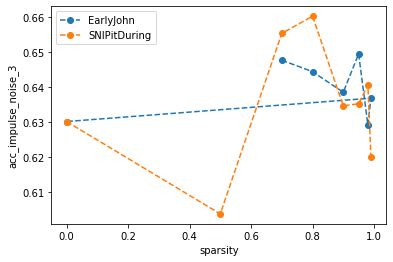

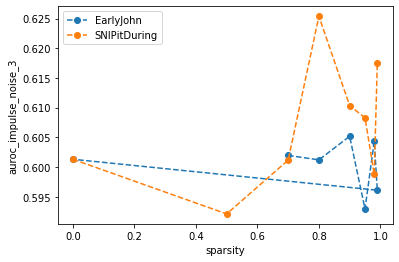

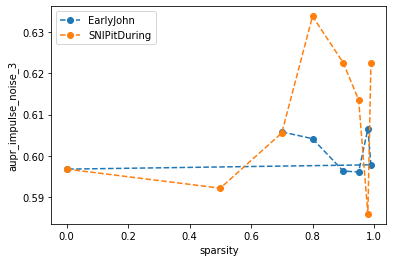

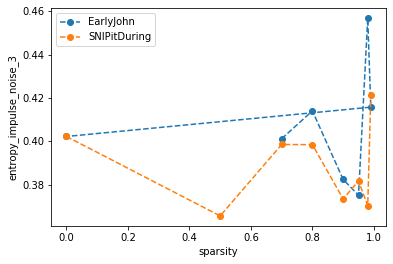

In [9]:
for col in results.columns:
    if col.startswith("result"):
        for crit in criterions:
            subset = results[(results["config.arguments.train_scheme"] == "DefaultTrainer") &
                       ((results["config.arguments.prune_criterion"] == crit) |
                       (results["config.arguments.prune_criterion"] == "EmptyCrit"))]
            plt.plot(subset["config.arguments.pruning_limit"], subset[col], linestyle='--', marker='o', label=crit)
        plt.xlabel("sparsity")
        plt.ylabel(col.split('.')[-1])
        plt.legend()
        plt.show()